<a href="https://colab.research.google.com/github/asedaama/Facility-location-prediction/blob/main/linear_target.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Pandas and numpy for data manipulation
import pandas as pd
import numpy as np
np.random.seed(8)

# Matplotlib and seaborn for plotting 
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['font.size'] = 24
matplotlib.rcParams['figure.figsize'] = (16,9)
plt.style.use('ggplot')

import seaborn as sns

from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df= pd.read_csv('C://Users//antwi//OneDrive//Desktop//TARGET.csv',encoding='latin-1')

In [ ]:
df.head()

,X.locale,Address.AddressLine1,Address.AddressLine2,Address.City,Address.CountryName,Address.County,Address.FormattedAddress,Address.IntersectionDescription,Address.Latitude,Address.Longitude,...,Is24Hours.Sat,IsOpen.Sat,Summary.Sat,ThruTime.Sat,BeginTime.Sun,Is24Hours.Sun,IsOpen.Sun,Summary.Sun,ThruTime.Sun,AllCapability
0,en-US,400 Oxford Exchange Blvd,NaN,Oxford,United States,Calhoun,"400 Oxford Exchange Blvd, Oxford, AL 36203-3459",SEC I-20 & Golden Creek Rd,33.608825,-85.783182,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Mobile Kiosk', 'Star..."
1,en-US,2640 Enterprise Dr,NaN,Opelika,United States,Lee,"2640 Enterprise Dr, Opelika, AL 36801-1511",NWC I-85 & Hwy 280,32.618108,-85.410636,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Cafe-Pizza', 'Fresh Grocery'..."
2,en-US,1129 S Park St,NaN,Carrollton,United States,Carroll,"1129 S Park St, Carrollton, GA 30117-4429",NWC US 27 & Hwy 166 Bypass,33.558920,-85.076473,...,False,True,8:00 a.m.-10:00 p.m.,22:00:00,8:00:00,False,True,8:00 a.m.-9:00 p.m.,21:00:00,NaN
3,en-US,555 Bullsboro Dr,NaN,Newnan,United States,Coweta,"555 Bullsboro Dr, Newnan, GA 30265-1045",SWC I-85 & Rte 34,33.392907,-84.758875,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Fresh Grocery', 'Mob..."
4,en-US,1591 Bradley Park Dr,NaN,Columbus,United States,Muscogee,"1591 Bradley Park Dr, Columbus, GA 31904-3071",NEC Bradley Pk & JR Allen Pkwy,32.534649,-84.971073,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Mobile Kiosk', 'Phot..."


In [ ]:
df.shape

(1829, 47)

In [ ]:
df.columns

Index(['X.locale', 'Address.AddressLine1', 'Address.AddressLine2',
       'Address.City', 'Address.CountryName', 'Address.County',
       'Address.FormattedAddress', 'Address.IntersectionDescription',
       'Address.Latitude', 'Address.Longitude', 'Address.PostalCode',
       'Address.Subdivision', 'AlternateIdentifier.ID', 'ID',
       'IsDaylightSavingsTimeRecognized', 'LocationMilestones.LastRemodelDate',
       'LocationMilestones.OpenDate', 'Market', 'Name',
       'OperatingHours..timeFormat', 'Store.StoreDistrictID',
       'Store.StoreGroupID', 'Store.StoreRegionID', 'SubTypeDescription',
       'TimeZone.TimeZoneCode', 'TimeZone.TimeZoneDescription',
       'TimeZone.TimeZoneOffset.OffsetCode',
       'TimeZone.TimeZoneOffset.OffsetHours', 'TypeCode', 'PhoneNumber',
       'FaxNumber', 'BeginTime.MF', 'Is24Hours.MF', 'IsOpen.MF', 'Summary.MF',
       'ThruTime.MF', 'BeginTime.Sat', 'Is24Hours.Sat', 'IsOpen.Sat',
       'Summary.Sat', 'ThruTime.Sat', 'BeginTime.Sun', 'Is24Hour

In [ ]:
df = df[['Address.Latitude','Address.Longitude','ID','Address.FormattedAddress','Address.Subdivision','PhoneNumber']]

In [ ]:
df.head()

,Address.Latitude,Address.Longitude,ID,Address.FormattedAddress,Address.Subdivision,PhoneNumber
0,33.608825,-85.783182,2153,"400 Oxford Exchange Blvd, Oxford, AL 36203-3459",AL,(256) 231-2900
1,32.618108,-85.410636,1499,"2640 Enterprise Dr, Opelika, AL 36801-1511",AL,(334) 705-0152
2,33.558920,-85.076473,1073,"1129 S Park St, Carrollton, GA 30117-4429",GA,(770) 838-9221
3,33.392907,-84.758875,1223,"555 Bullsboro Dr, Newnan, GA 30265-1045",GA,(770) 502-0294
4,32.534649,-84.971073,1179,"1591 Bradley Park Dr, Columbus, GA 31904-3071",GA,(706) 321-0831


In [ ]:
df.describe()

,Address.Latitude,Address.Longitude,ID
count,1829.000000,1829.000000,1829.000000
mean,37.618538,-93.586666,1571.299617
std,5.203413,16.684875,776.198631
min,19.648413,-158.092822,3.000000
25%,33.853038,-106.077670,993.000000
50%,38.579381,-88.200911,1484.000000
75%,41.561322,-80.599357,2191.000000
max,61.578202,-68.741560,3295.000000


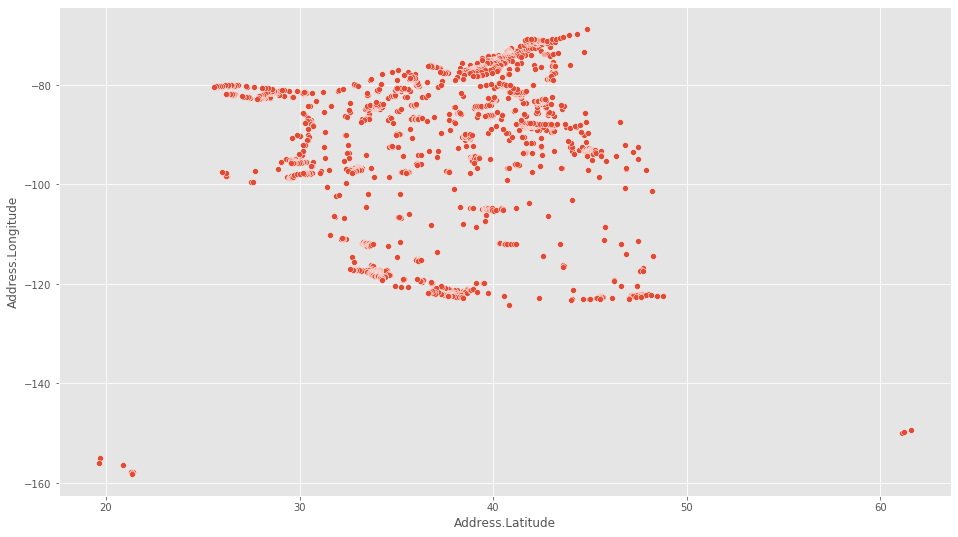

In [ ]:
sns.scatterplot(data=df, x = 'Address.Latitude' , y = 'Address.Longitude')

In [ ]:
import plotly.graph_objects as go

df['text'] = df['Address.FormattedAddress'] +'Phone Number:'+ df['PhoneNumber'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = df['Address.Longitude'],
        lat = df['Address.Latitude'],
        text = df['text'],
        mode = 'markers',
        marker = dict(
            opacity = 0.8,
            reversescale=True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = 0,
            color = df['ID'],
            cmax = df['ID'].max(),
        )))

fig.update_layout(
        title = 'Target location in USA<br>',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True
        ),
    )
fig.show()

In [ ]:
import folium
import re

In [ ]:
m= folium.Map(location=[df['Address.Latitude'].mean(),df['Address.Longitude'].mean()],zoom_start=4,
             tiles='openstreetmap')
for _, row in df.iterrows():
    folium.Marker(
    location=[row['Address.Latitude'],row['Address.Longitude']],
    radius=5,
    popup = re.sub(r'[^a-zA-Z]+','',row['Address.FormattedAddress']),
    color='#1787FE',
    fill=True,
    fill_color='#1787FE').add_to(m)
m

In [ ]:
# need to drop the Address.name column
df1 = df[['Address.Latitude','Address.Longitude']]

In [ ]:
def format_equation(M,p):
    C = [0 for _ in range(2 * p + 2 * len(M) + len(M) * p + 2 * p * len(M))]
    start = 2 * p + 2 * len(M)
    end = start + len(M) * p
    for i in range(start, end):
        C[i] = 1
    return C

In [ ]:
def format_left_in(M,p):
    A = [[0 for i in range(len(M) * (2 + 3 * p) + p * 2)] for _ in range(len(M) * 5 * p)]
    x = 0
    y = 1
    d = p * 2 + len(M) * 2
    a = p * 2
    b = p * 2 + 1
    dx = p * 2 + len(M) * (2 + p)
    dy = p * 2 + len(M) * (2 + p) + 1
    it = 0
    for i in range(0, len(M)*p):
        # constraint 1
        A[it][dx] = 1
        A[it][dy] = 1
        A[it][d] = -1
        # constraint 2
        A[it + 1][x] = 1
        A[it + 1][a] = -1
        A[it + 1][dx] = -1
        # constraint 3
        A[it + 2][x] = -1
        A[it + 2][a] = 1
        A[it + 2][dx] = -1
        # constraint 4
        A[it + 3][y] = 1
        A[it + 3][b] = -1
        A[it + 3][dy] = -1
        # constraint 5
        A[it + 4][y] = -1
        A[it + 4][b] = 1
        A[it + 4][dy] = -1
        # update indexes
        # consider the next (xi,yi) when the last element is reached
        if i % len(M) == len(M) - 1:
            x += 2
            y += 2
            d = p * 2 + len(M) * 2
            a = p * 2
            b = p * 2 + 1
        else :
            a += 2
            b += 2
            d += 1
        dx += 2
        dy += 2
        it += 5
    return A

In [ ]:
def format_right_in(M,p):
    b = [0 for _ in range(len(M) * 5 * p)]
    return b

In [ ]:
def format_left_eq(M,p):
    a_eq = [[0 for _ in range(p * 2 + len(M) * (2 + 3 * p))] for _ in range(len(M) * 2)]
    nb_one = p * 2
    for i in range(len(M) * 2):
        a_eq[i][i+nb_one] = 1
    return a_eq

In [ ]:
def format_right_eq(M,p):
    b_eq = []
    for a, b in M: 
        b_eq.append(a)
        b_eq.append(b)
    return b_eq

In [ ]:
def compute_simplex(M,p):
    C    = format_equation(M, p)
    a_in = format_left_in(M, p)
    b_in = format_right_in(M, p)
    a_eq = format_left_eq(M, p)
    b_eq = format_right_eq(M,p)
    res = linprog(C, A_ub=a_in, b_ub=b_in, A_eq=a_eq, b_eq=b_eq)
    # adjust 0f in nf for n decimals precision
    return ((res.x[0]),(res.x[1]))

In [ ]:
def cluster(M,p):
    data = np.vstack(M)
    means, _ = kmeans(data, p)
    cluster_indexes, _ = vq(data, means)
    clusters = [[] for _ in range(p)]
    for i in range(len(cluster_indexes)):
        index = cluster_indexes[i]
        clusters[index].append((data[i][0], data[i][1]))
    return clusters

In [ ]:
import scipy
from typing import List
from typing import Tuple
from scipy.cluster.vq import vq,kmeans,whiten
from scipy.optimize import linprog

In [ ]:
df1.head()

,Address.Latitude,Address.Longitude
0,33.608825,-85.783182
1,32.618108,-85.410636
2,33.558920,-85.076473
3,33.392907,-84.758875
4,32.534649,-84.971073


In [ ]:
df2 = df1[['Address.Latitude','Address.Longitude']]

In [ ]:
df2['Address.Longitude']= abs(df2[['Address.Longitude']])

In [ ]:
df2.head()

,Address.Latitude,Address.Longitude
0,33.608825,85.783182
1,32.618108,85.410636
2,33.558920,85.076473
3,33.392907,84.758875
4,32.534649,84.971073


In [ ]:
M = df2.values

In [ ]:
def solve(M,p):
    clusters = cluster(M, p)
    results = []
    for c in clusters:
        results.append(compute_simplex(c, 1))
    return results

In [ ]:
p = 15

In [ ]:
solve(M,p)

[(33.948211546213365, 117.88731782902899),
 (41.25425725489271, 83.46488768905728),
 (41.5825399955052, 73.28680699228012),
 (31.43187499346548, 96.84490697837937),
 (39.88645299553511, 105.07951098945563),
 (33.93050299515205, 85.8686859865896),
 (35.41712399613168, 80.15773499046935),
 (27.95770192209276, 81.44509786546121),
 (37.75778999771798, 121.84062401886867),
 (33.43520333268158, 111.78620702694435),
 (47.12361952285337, 122.36217257655748),
 (21.29235097841794, 157.73941251398736),
 (44.77565699500888, 93.54268298863691),
 (39.73346599833264, 76.87317299842012),
 (41.867828870360505, 88.04788567604963)]

In [ ]:
sol = solve(M,p)

In [ ]:
b = pd.DataFrame(sol, columns= ['lat','long'])

In [ ]:
b.head()

,lat,long
0,41.216528,82.920862
1,28.015839,81.480392
2,29.782355,95.751454
3,41.940098,87.886532
4,21.341418,156.126589


In [ ]:
b['long']= -abs(b['long'])

In [ ]:
b.head()

,lat,long
0,41.216528,-82.920862
1,28.015839,-81.480392
2,29.782355,-95.751454
3,41.940098,-87.886532
4,21.341418,-156.126589


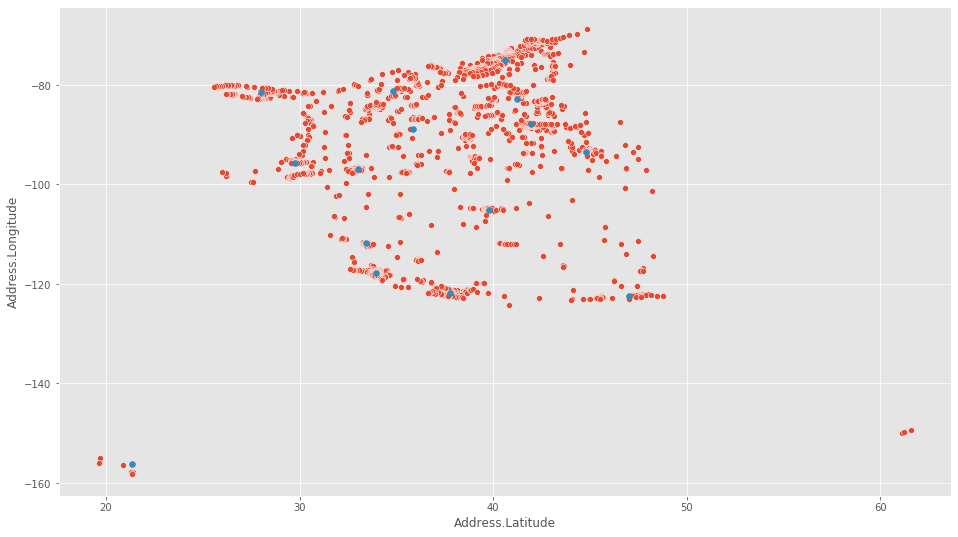

In [ ]:
sns.scatterplot(data=df, x = 'Address.Latitude' , y = 'Address.Longitude')
plt.scatter(data = b, x='lat',y = 'long')

In [ ]:
import geopandas as gpd
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import tqdm
from tqdm.notebook import tqdm

In [ ]:
b['geom'] = b['lat'].map(str) + ',' + b['long'].map(str)
b['geom'][0]

'41.21652799948853,-82.92086199876421'

In [ ]:
locator = Nominatim(user_agent='myGeocoder', timeout=10)
rgeocode = RateLimiter(locator.reverse, min_delay_seconds=0.001)

In [ ]:
tqdm.pandas()

b['address'] = b['geom'].progress_apply(rgeocode)
b.head()

,lat,long,geom,address
0,41.216528,-82.920862,"41.21652799948853,-82.92086199876421","(SR 18, Cooper, Scipio Township, Seneca County..."
1,28.015839,-81.480392,"28.015838999894054,-81.48039199963203","(Polk County, Florida, United States, (27.9448..."
2,29.782355,-95.751454,"29.782355000117157,-95.75145399709356","(Whataburger, 307, Mason Road, Katy, Harris Co..."
3,41.940098,-87.886532,"41.94009794905903,-87.88653189083959","(Franklin Avenue, Franklin Park, Leyden Townsh..."
4,21.341418,-156.126589,"21.341417684431015,-156.12658860769093",None


In [ ]:
b.drop('geom', inplace=True,axis=1)

In [ ]:
b.head()

,lat,long,address
0,41.216528,-82.920862,"(SR 18, Cooper, Scipio Township, Seneca County..."
1,28.015839,-81.480392,"(Polk County, Florida, United States, (27.9448..."
2,29.782355,-95.751454,"(Whataburger, 307, Mason Road, Katy, Harris Co..."
3,41.940098,-87.886532,"(Franklin Avenue, Franklin Park, Leyden Townsh..."
4,21.341418,-156.126589,None


In [ ]:
m2= folium.Map(location=[df['Address.Latitude'].mean(),df['Address.Longitude'].mean()],zoom_start=4,
             tiles='openstreetmap')
tooltip = 'Click me!'
for _, row in b.iterrows():
    folium.Marker(
    location=[row['lat'],row['long']],
    popup = row['address'],
    tooltip=tooltip, icon= folium.Icon(color= 'red',icon='info-sign')
    ).add_to(m2)
for _, row in df.iterrows():    
    folium.Marker(
    location=[row['Address.Latitude'],row['Address.Longitude']],
    popup =row['Address.FormattedAddress'],
    tooltip=tooltip
    ).add_to(m2)
m2

In [ ]:
m2= folium.Map(location=[df['Address.Latitude'].mean(),df['Address.Longitude'].mean()],zoom_start=4,
             tiles='openstreetmap')
tooltip = 'Click me!'
for _, row in b.iterrows():
    folium.Marker(
    location=[row['lat'],row['long']],
    popup = row['address'],
    tooltip=tooltip, icon= folium.Icon(color= 'red',icon='info-sign')
    ).add_to(m2)
m2